Advanced thermodynamics - BMEGEENUVHT
Final Project

Gregorio Jaca
neptun code: U8L9B9

In [17]:
import numpy as np
import matplotlib.pyplot as plt

notation difference from handwritten notes: I dropped the _r subscript for the dimensionless values.

Parameters

In [90]:
# physical parameters
beta = 0.3
# T_a = 2 # this is not used
p_a = 5
tau = 0.2
f = 3 # Degrees of Motion

# Q = 0 # heating is 0. $T_a$ is not used which explain the 0 heat exchange.

# simulation parameters
dt = 0.001 # to maintain stability dt <<< tau
N = 50000
Time = N*dt

Functions

In [91]:
# eqs of state
def p_rev(T, v): 
    return ((8*T) / ((3*v)-1)) - (3 / (v**2))

# thermo relations. 
# Q: are these also eqs of state?
def e_rev(T, v): # these two are the same
    return (4/3)*f*T - (3/v)
def T(e_rev, v): # these two are the same
    return (3/4/f)*(e_rev+3/v)
def e(e_rev, T, p_irr):
    return e_rev + tau*(p_irr**2)/(2*beta)
def p(p_rev, p_irr):
    return p_rev + p_irr

# diff eqs
# notation: the dt_ means time derivative
def dt_p_irr(b, p_irr):
    return -(beta*b + p_irr) / tau
def dt_v(b):
    return b
def dt_e(p, b):
    return -p*b
def dt_b(p, p_a):
    return p-p_a

Initialization

In [92]:
# initialize 
# notation: 
# _n: the physically meaningful values
# _m: values shifted by -1/2

# diferential
p_irr_n = np.zeros(N) 
p_irr_m = np.zeros(N)  

e_n = np.zeros(N) 
e_m = np.zeros(N)  

# b_n = np.zeros(N)  # It was curious to me that we did not need the b_n values, only the ones at (1/2)*dt shifted times. Then I realized this is because it is the time-derivative of v_n, and for time derivatives, the "shited" value is the physically meaningful.
b_m = np.zeros(N)  

v_n = np.zeros(N) 
v_m = np.zeros(N)  

# algebraic
p_n = np.zeros(N) 
p_m = np.zeros(N)  

e_rev_n = np.zeros(N) 
e_rev_m = np.zeros(N)  

p_rev_n = np.zeros(N) 
p_rev_m = np.zeros(N)  

T_n = np.zeros(N) 
T_m = np.zeros(N)  

Initial conditions

In [93]:
T_n[0] = 1.1 # slightly hypercritical
v_n[0] = 1.1 # slightly hypercritical
b_n0 = 0 # initially static
p_irr_n[0] = 0 # I think it makes sense since the idea is that you start close to critical point. 

p_rev_n[0] = p_rev(T_n[0], v_n[0]) 
e_rev_n[0] = e_rev(T_n[0], v_n[0])
# extra
e_n[0] = e(e_rev_n[0], T_n[0], p_irr_n[0])
p_n[0] = p(p_rev_n[0], p_irr_n[0]) 

Pre-initial values

In [94]:
# these "pre-initial values" are calculated using the euler method in reverse.
# notation: the _m means values shifted by -1/2 in time steps
b_m[0] = b_n0 - (dt/2) * dt_b(p_n[0], p_a) 
v_m[0] = v_n[0] - (dt/2) * dt_v(b_n0)

p_irr_m[0] = p_irr_n[0] - (dt/2) * dt_p_irr(b_n0, p_irr_n[0])
e_m[0] = e_n[0] - (dt/2) * dt_e(p_n[0], b_n0)


# I need p_rev_m[0], how do I get it? It is a state variable p_rev(T, v)

# Compute T_m[0] from e_rev_m[0] and v_m[0]
e_rev_m[0] = e_m[0] - (tau/2/beta) * (p_irr_m[0])**2 # this is obtained from inverting e(e_rev, T, p_irr)
T_m[0] = T(e_rev_m[0], v_m[0]) # I could have done T_m[0] = T_n[0] - (dt/2) * dt_T(...) but I don't have dt_T ! So I calculated e_rev_m[0]
p_rev_m[0] = p_rev(T_m[0], v_m[0])

p_rev_n[-1] = 2*p_rev_m[0] - p_rev_n[0] # I know that [-1] refers to the last element of the array, but this will just get overwritten at the end with the correct physical value (also it does not appear in the computation of any other value until it is properly overwritten). => no trouble. clever.

Solution

In [95]:
# This can't be fully vectorized (for numerical optimization if performance had been a problem) as it is a sequential ODE. Luckily, using a simple for-loop was fast enough for my use-case.
for i in range(N-1):

    b_m[i+1] = b_m[i] + dt * (p_n[i] - p_a)

    # p_irr_m[i+1] = (1 / ((tau/dt)+(1/2)) ) * ( (-beta * (1/2) * (b_m[i+1] + b_m[i])) + (((tau/dt)-(1/2)) * p_irr_m[i]) ) # variant 1. note: here we use (b_m[i+1] + b_m[i]), but we don't use b_n[i], because we don't calculate the b_n[i] array

    p_irr_m[i+1] = np.exp(-dt/tau) * p_irr_m[i] + beta * ( (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i+1]) - (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i])*np.exp(-dt/tau) ) # variant 2. The past stress decays exponentially, so it has some memory and is not instantaneous, this depends on tau.

    # diff
    # linear interpolation.
    p_irr_n[i+1] = 2 * p_irr_m[i+1] - p_irr_n[i]
    p_rev_m[i+1] = 2 * p_rev_n[i] - p_rev_m[i]
    
    # parabolic interpolation. causes instability
    # p_irr_n[i+1] = 3*p_irr_m[i+1] -3*p_irr_n[i] + p_irr_m[i] 
    # p_rev_m[i+1] = 3*p_rev_n[i] -3*p_rev_m[i] + p_rev_n[i-1]

    # algebraic
    p_m[i+1] = p(p_rev_m[i+1], p_irr_m[i+1]) # p_rev_m[i+1] + p_irr_m[i+1] 

    # diff
    v_n[i+1] = v_n[i] + dt * dt_v(b_m[i+1])
    e_n[i+1] = e_n[i] + dt * dt_e(p_m[i+1], b_m[i+1])

    # algebraic
    # e_rev_n[i+1] = e_rev(T_n[i+1], v_n[i+1]) # this is what (naively) I would have done, but we havent calculated T_n[i+1] yet! it is 0! so we do:
    e_rev_n[i+1] = e_n[i+1] - (tau/2/beta) * (p_irr_n[i+1])**2 
    # now effectively we calculate T_n[i+1]
    T_n[i+1] = T(e_rev_n[i+1], v_n[i+1])  
    p_rev_n[i+1] = p_rev(T_n[i+1], v_n[i+1])
    p_n[i+1] = p(p_rev_n[i+1], p_irr_n[i+1])    

t = np.linspace(start=0, stop=Time, num=N)

Entropy:

Since the energy had a non-reversible term 
- (tau / (2 * beta)) * p_irr_n**2
I thought to add a similar term for the non-reversibility in entropy
- (tau / (2 * beta * T_n)) * p_irr_n**2

This was wrong because the entropy is a state function and thus, the irreversibility is already accounted for in T_n and v_n. The entropy calculation was simpler than expected.

In [96]:
s_n = (f/2) * np.log(T_n) + np.log(3*v_n - 1) # derived from the state equation

# Entropy production rate
s_dot = -p_irr_n * b_m / T_n # (p_irr_n**2) / (beta * T_n)

Visualize 

In [97]:
def visualize():

    fig, ax1 = plt.subplots()

    var_colors = {
        'v_n': '#0072B2',
        'T_n': '#D55E00',
        'b_m': '#009E73',
        # 'e_n': '#CC79A7',
    }

    # Base axis
    ax1.plot(t, v_n, color=var_colors['v_n'], label='v_n')
    ax1.set_ylabel('v_n', color=var_colors['v_n'])
    ax1.tick_params(axis='y', labelcolor=var_colors['v_n'])

    # Second axis
    ax2 = ax1.twinx()
    ax2.plot(t, T_n, color=var_colors['T_n'], label='T_n')
    ax2.set_ylabel('T_n', color=var_colors['T_n'])
    ax2.tick_params(axis='y', labelcolor=var_colors['T_n'])

    # Third axis (offset)
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('axes', 1.2))
    ax3.plot(t, b_m, color=var_colors['b_m'], label='b_m')
    ax3.set_ylabel('b_m', color=var_colors['b_m'])
    ax3.tick_params(axis='y', labelcolor=var_colors['b_m'])

    ax1.set_xlabel('t')
    plt.title('Variables vs t')
    plt.tight_layout()
    plt.show()
        
    fig, ax1 = plt.subplots()

    # Base axis
    ax1.plot(t, s_dot, color=var_colors['v_n'], label='s_dot')
    ax1.set_ylabel('s_dot', color=var_colors['v_n'])
    ax1.tick_params(axis='y', labelcolor=var_colors['v_n'])

    # Second axis
    ax2 = ax1.twinx()
    ax2.plot(t, s_n, color=var_colors['T_n'], label='s_n')
    ax2.set_ylabel('s_n', color=var_colors['T_n'])
    ax2.tick_params(axis='y', labelcolor=var_colors['T_n'])

    # The smaller tau, the closer s_rev_n and s_n are to each other

    # # Third axis (offset)
    # ax3 = ax1.twinx()
    # ax3.spines['right'].set_position(('axes', 1.2))
    # ax3.plot(t, s_dot, color=var_colors['b_m'], label='s_dot')
    # ax3.set_ylabel('s_dot', color=var_colors['b_m'])
    # ax3.tick_params(axis='y', labelcolor=var_colors['b_m'])

    ax1.set_xlabel('t')
    plt.title('Variables vs t')
    plt.tight_layout()
    plt.show()


    # ------------ show pressure, then settles to p_a

    plt.plot(t, p_n, label="p")
    plt.hlines(y=[5], xmin=np.min(t), xmax=np.max(t), label="p_a", linestyles="dashed", colors="red")
    plt.title('Pressure vs t')
    plt.xlabel("t")
    plt.ylabel("p")
    plt.legend()
    plt.tight_layout()
    plt.show()

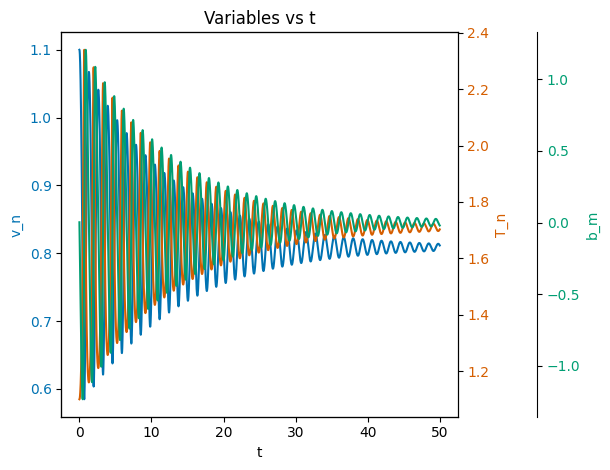

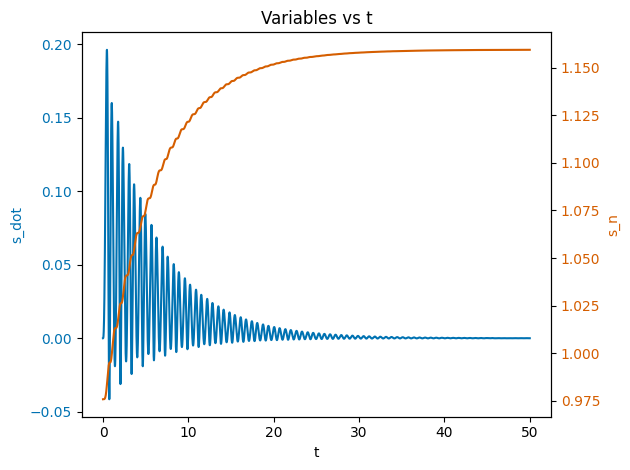

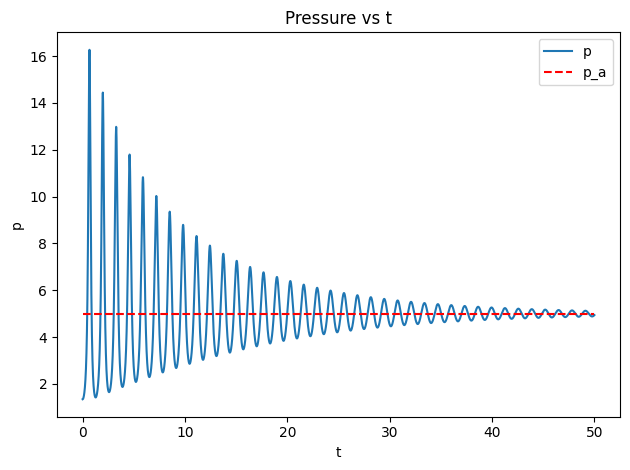

In [98]:
visualize()

We see how the internal pressure eventually settles to the atmospheric pressure.

We see the system oscillating, and getting asymptotically close to the equilibrium state (defined by the different parameters, such as the external pressure). The system is dissipative, and we see how the oscillation amplitudes decay.

Entropy initally increases (due to the irreversibility), and then it remains close to constant in the end when the system is settling.

In [99]:
print(f"Entropy produced = {s_n[-1] - s_n[0]}")

Entropy produced = 0.18349796245310113


We also look at the v-p space evolution in time
note: creating the animation is time consuming

In [27]:
# animate v-p space evolution
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

T_plot = 1.1
v_range = (0.45, 1.5)
v_vals = np.linspace(v_range[0], v_range[1], 300)
p_state = ((8 * T_plot) / (3 * v_vals - 1)) - (3 / v_vals**2)


N_anim = min(300, len(v_n))
idx_anim = np.linspace(0, len(v_n)-1, N_anim).astype(int)
v_n_anim = np.array(v_n)[idx_anim]
p_n_anim = np.array(p_n)[idx_anim]


fig, ax = plt.subplots()
ax.plot(v_vals, p_state, 'k--', label='State Eq.')
ax.set_xlabel('v')
ax.set_ylabel('p')
ax.set_title('Phase Space: (v, p)')
ax.legend()

v_min = min(np.min(v_vals), np.min(v_n_anim))
v_max = max(np.max(v_vals), np.max(v_n_anim))
p_min = min(np.min(p_state), np.min(p_n_anim))
p_max = max(np.max(p_state), np.max(p_n_anim))
ax.set_xlim(v_min*0.9, v_max*1.1)
ax.set_ylim(p_min*0.9, p_max*1.1)

line, = ax.plot([], [], 'b-', lw=2)
point_init, = ax.plot([], [], 'go')
point_final, = ax.plot([], [], 'ro')

def init():
    line.set_data([], [])
    point_init.set_data([], [])
    point_final.set_data([], [])
    return line, point_init, point_final

def animate(i):
    # Always pass slices, never scalars
    line.set_data(v_n_anim[:i+1], p_n_anim[:i+1])
    point_init.set_data([v_n_anim[0]], [p_n_anim[0]])
    point_final.set_data([v_n_anim[i]], [p_n_anim[i]])
    return line, point_init, point_final

ani = FuncAnimation(fig, animate, frames=N_anim, init_func=init,
                    blit=True, interval=30, repeat=False)

plt.close(fig)
HTML(ani.to_jshtml())

With this animation we see how the system oscillates until it reaches its final state asymptotically reaching the atmospheric pressure

Finally we will examine the effect of different parameters and extrapolation techniques.

Above, we used a linear interpolation scheme for p_irr_n[i+1] and p_rev_m[i+1], now we examine a parabolic interpolation:

C:\Users\grego\AppData\Local\Temp\ipykernel_9664\3043364208.py:23: RuntimeWarning: overflow encountered in scalar multiply
  return -p*b
C:\Users\grego\AppData\Local\Temp\ipykernel_9664\287253315.py:39: RuntimeWarning: invalid value encountered in scalar subtract
  p_irr_m[i+1] = np.exp(-dt/tau) * p_irr_m[i] + beta * ( (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i+1]) - (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i])*np.exp(-dt/tau) ) # variant 2. The past stress decays exponentially, so it has some memory and is not instantaneous, this depends on tau.
C:\Users\grego\AppData\Local\Temp\ipykernel_9664\287253315.py:67: RuntimeWarning: invalid value encountered in log
  s_n = (f/2) * np.log(T_n) + np.log(3*v_n - 1) # derived from the state equation


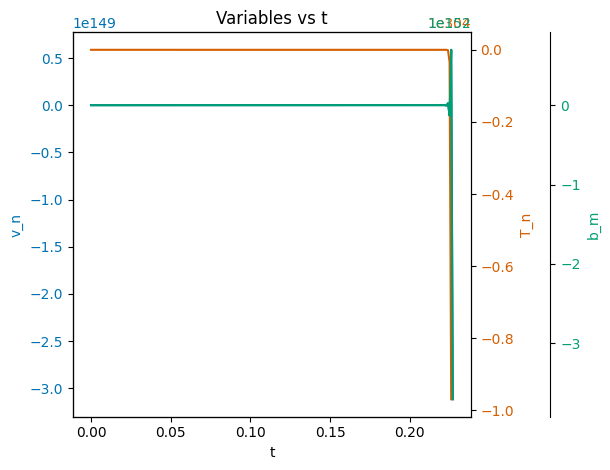

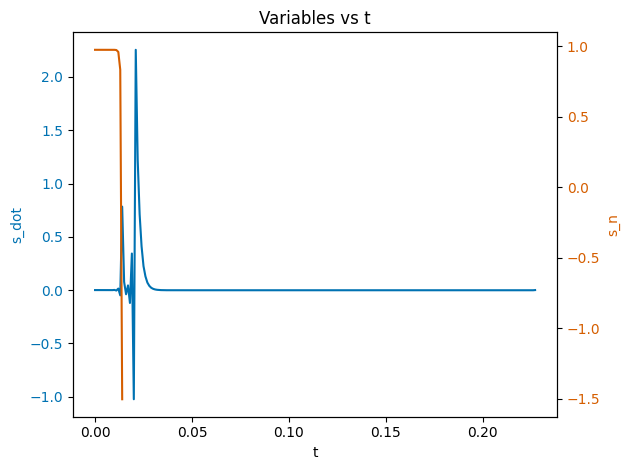

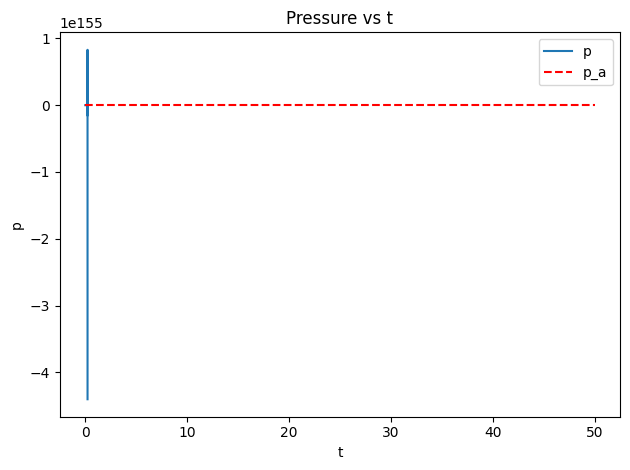

In [28]:
T_n[0] = 1.1 # slightly hypercritical
v_n[0] = 1.1 # slightly hypercritical
b_n0 = 0 # initially static
p_irr_n[0] = 0 # I think it makes sense since the idea is that you start close to critical point. 

p_rev_n[0] = p_rev(T_n[0], v_n[0]) 
e_rev_n[0] = e_rev(T_n[0], v_n[0])
# extra
e_n[0] = e(e_rev_n[0], T_n[0], p_irr_n[0])
p_n[0] = p(p_rev_n[0], p_irr_n[0]) 


# these "pre-initial values" are calculated using the euler method in reverse.
# notation: the _m means values shifted by -1/2 in time steps
b_m[0] = b_n0 - (dt/2) * dt_b(p_n[0], p_a) 
v_m[0] = v_n[0] - (dt/2) * dt_v(b_n0)

p_irr_m[0] = p_irr_n[0] - (dt/2) * dt_p_irr(b_n0, p_irr_n[0])
e_m[0] = e_n[0] - (dt/2) * dt_e(p_n[0], b_n0)


# I need p_rev_m[0], how do I get it? It is a state variable p_rev(T, v)

# Compute T_m[0] from e_rev_m[0] and v_m[0]
e_rev_m[0] = e_m[0] - (tau/2/beta) * (p_irr_m[0])**2 # this is obtained from inverting e(e_rev, T, p_irr)
T_m[0] = T(e_rev_m[0], v_m[0]) # I could have done T_m[0] = T_n[0] - (dt/2) * dt_T(...) but I don't have dt_T ! So I calculated e_rev_m[0]
p_rev_m[0] = p_rev(T_m[0], v_m[0])

p_rev_n[-1] = 2*p_rev_m[0] - p_rev_n[0] # I know that [-1] refers to the last element of the array, but this will just get overwritten at the end with the correct physical value (also it does not appear in the computation of any other value until it is properly overwritten). => no trouble. clever.


# This can't be fully vectorized (for numerical optimization if performance had been a problem) as it is a sequential ODE. Luckily, using a simple for-loop was fast enough for my use-case.
for i in range(N-1):

    b_m[i+1] = b_m[i] + dt * (p_n[i] - p_a)

    # p_irr_m[i+1] = (1 / ((tau/dt)+(1/2)) ) * ( (-beta * (1/2) * (b_m[i+1] + b_m[i])) + (((tau/dt)-(1/2)) * p_irr_m[i]) ) # variant 1. note: here we use (b_m[i+1] + b_m[i]), but we don't use b_n[i], because we don't calculate the b_n[i] array

    p_irr_m[i+1] = np.exp(-dt/tau) * p_irr_m[i] + beta * ( (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i+1]) - (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i])*np.exp(-dt/tau) ) # variant 2. The past stress decays exponentially, so it has some memory and is not instantaneous, this depends on tau.

    # diff
    # linear interpolation.
    # p_irr_n[i+1] = 2 * p_irr_m[i+1] - p_irr_n[i]
    # p_rev_m[i+1] = 2 * p_rev_n[i] - p_rev_m[i]
    
    # parabolic interpolation. causes instability
    p_irr_n[i+1] = 3*p_irr_m[i+1] -3*p_irr_n[i] + p_irr_m[i] 
    p_rev_m[i+1] = 3*p_rev_n[i] -3*p_rev_m[i] + p_rev_n[i-1]

    # algebraic
    p_m[i+1] = p(p_rev_m[i+1], p_irr_m[i+1]) # p_rev_m[i+1] + p_irr_m[i+1] 

    # diff
    v_n[i+1] = v_n[i] + dt * dt_v(b_m[i+1])
    e_n[i+1] = e_n[i] + dt * dt_e(p_m[i+1], b_m[i+1])

    # algebraic
    # e_rev_n[i+1] = e_rev(T_n[i+1], v_n[i+1]) # this is what (naively) I would have done, but we havent calculated T_n[i+1] yet! it is 0! so we do:
    e_rev_n[i+1] = e_n[i+1] - (tau/2/beta) * (p_irr_n[i+1])**2 
    # now effectively we calculate T_n[i+1]
    T_n[i+1] = T(e_rev_n[i+1], v_n[i+1])  
    p_rev_n[i+1] = p_rev(T_n[i+1], v_n[i+1])
    p_n[i+1] = p(p_rev_n[i+1], p_irr_n[i+1])    

t = np.linspace(start=0, stop=Time, num=N)

s_n = (f/2) * np.log(T_n) + np.log(3*v_n - 1) # derived from the state equation

# Entropy production rate
s_dot = -p_irr_n * b_m / T_n # (p_irr_n**2) / (beta * T_n)

visualize()

We get no convergence and numerical errors, even when using very small time steps. The parabolic extrapolation is unstable and introduces oscillatory behaviour amplifying noise or small numerical errors, which lead to a failed simulation. Linear extrapolation was robust, and, testing it with different time steps, it showed good accuracy.

We investigate the system using tau and beta ~ 0

note: 
Many terms involve terms with division by tau or beta which are invalid for tau, beta = 0
This was present in many equations, so what we did is use a small value. 

What does "small" mean for tau?

Previously we mentioned that, in order to properly capture the system behaviour, we needed a dt <<< tau, but now this is no longer desired, as we do not want to model the tau driven relaxation, and we want tau to be extremely close to 0 (which means tau << dt)


In [100]:
tau = 1e-10
beta = 1e-10

# simulation parameters
dt = 0.001 # to maintain stability dt <<< tau
N = 50000
Time = N*dt

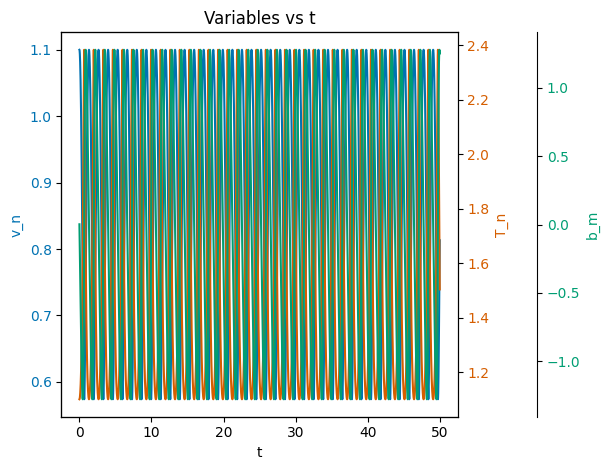

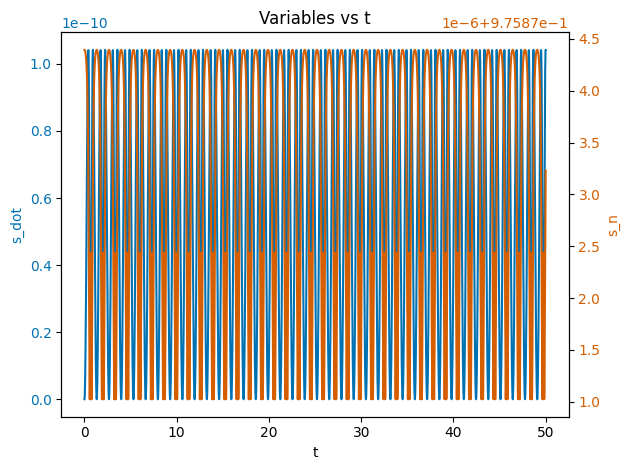

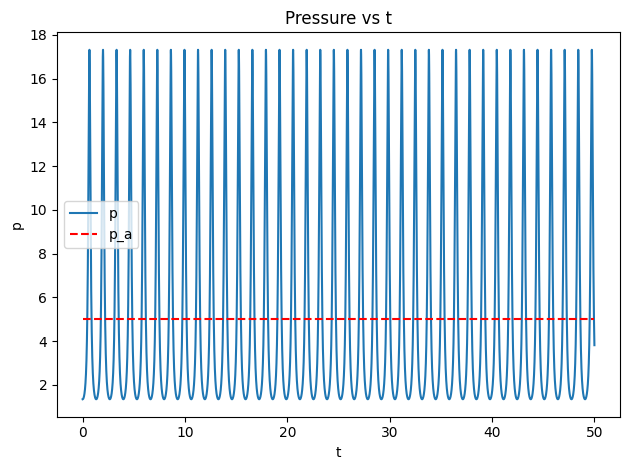

In [101]:
# initialize 
# notation: 
# _n: the physically meaningful values
# _m: values shifted by -1/2

# diferential
p_irr_n = np.zeros(N) 
p_irr_m = np.zeros(N)  

e_n = np.zeros(N) 
e_m = np.zeros(N)  

# b_n = np.zeros(N)  # It was curious to me that we did not need the b_n values, only the ones at (1/2)*dt shifted times. Then I realized this is because it is the time-derivative of v_n, and for time derivatives, the "shited" value is the physically meaningful.
b_m = np.zeros(N)  

v_n = np.zeros(N) 
v_m = np.zeros(N)  

# algebraic
p_n = np.zeros(N) 
p_m = np.zeros(N)  

e_rev_n = np.zeros(N) 
e_rev_m = np.zeros(N)  

p_rev_n = np.zeros(N) 
p_rev_m = np.zeros(N)  

T_n = np.zeros(N) 
T_m = np.zeros(N)  

T_n[0] = 1.1 # slightly hypercritical
v_n[0] = 1.1 # slightly hypercritical
b_n0 = 0 # initially static
p_irr_n[0] = 0 # I think it makes sense since the idea is that you start close to critical point. 

p_rev_n[0] = p_rev(T_n[0], v_n[0]) 
e_rev_n[0] = e_rev(T_n[0], v_n[0])
# extra
e_n[0] = e(e_rev_n[0], T_n[0], p_irr_n[0])
p_n[0] = p(p_rev_n[0], p_irr_n[0]) 


# these "pre-initial values" are calculated using the euler method in reverse.
# notation: the _m means values shifted by -1/2 in time steps
b_m[0] = b_n0 - (dt/2) * dt_b(p_n[0], p_a) 
v_m[0] = v_n[0] - (dt/2) * dt_v(b_n0)

p_irr_m[0] = p_irr_n[0] - (dt/2) * dt_p_irr(b_n0, p_irr_n[0])
e_m[0] = e_n[0] - (dt/2) * dt_e(p_n[0], b_n0)


# I need p_rev_m[0], how do I get it? It is a state variable p_rev(T, v)

# Compute T_m[0] from e_rev_m[0] and v_m[0]
e_rev_m[0] = e_m[0] - (tau/2/beta) * (p_irr_m[0])**2 # this is obtained from inverting e(e_rev, T, p_irr)
T_m[0] = T(e_rev_m[0], v_m[0]) # I could have done T_m[0] = T_n[0] - (dt/2) * dt_T(...) but I don't have dt_T ! So I calculated e_rev_m[0]
p_rev_m[0] = p_rev(T_m[0], v_m[0])

p_rev_n[-1] = 2*p_rev_m[0] - p_rev_n[0] # I know that [-1] refers to the last element of the array, but this will just get overwritten at the end with the correct physical value (also it does not appear in the computation of any other value until it is properly overwritten). => no trouble. clever.


# This can't be fully vectorized (for numerical optimization if performance had been a problem) as it is a sequential ODE. Luckily, using a simple for-loop was fast enough for my use-case.
for i in range(N-1):

    b_m[i+1] = b_m[i] + dt * (p_n[i] - p_a)

    # p_irr_m[i+1] = (1 / ((tau/dt)+(1/2)) ) * ( (-beta * (1/2) * (b_m[i+1] + b_m[i])) + (((tau/dt)-(1/2)) * p_irr_m[i]) ) # variant 1. note: here we use (b_m[i+1] + b_m[i]), but we don't use b_n[i], because we don't calculate the b_n[i] array

    p_irr_m[i+1] = np.exp(-dt/tau) * p_irr_m[i] + beta * ( (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i+1]) - (((b_m[i+1]-b_m[i]) * (tau/dt)) - b_m[i])*np.exp(-dt/tau) ) # variant 2. The past stress decays exponentially, so it has some memory and is not instantaneous, this depends on tau.

    # diff
    # linear interpolation.
    p_irr_n[i+1] = 2 * p_irr_m[i+1] - p_irr_n[i]
    p_rev_m[i+1] = 2 * p_rev_n[i] - p_rev_m[i]
    
    # parabolic interpolation. causes instability
    # p_irr_n[i+1] = 3*p_irr_m[i+1] -3*p_irr_n[i] + p_irr_m[i] 
    # p_rev_m[i+1] = 3*p_rev_n[i] -3*p_rev_m[i] + p_rev_n[i-1]

    # algebraic
    p_m[i+1] = p(p_rev_m[i+1], p_irr_m[i+1]) # p_rev_m[i+1] + p_irr_m[i+1] 

    # diff
    v_n[i+1] = v_n[i] + dt * dt_v(b_m[i+1])
    e_n[i+1] = e_n[i] + dt * dt_e(p_m[i+1], b_m[i+1])

    # algebraic
    # e_rev_n[i+1] = e_rev(T_n[i+1], v_n[i+1]) # this is what (naively) I would have done, but we havent calculated T_n[i+1] yet! it is 0! so we do:
    e_rev_n[i+1] = e_n[i+1] - (tau/2/beta) * (p_irr_n[i+1])**2 
    # now effectively we calculate T_n[i+1]
    T_n[i+1] = T(e_rev_n[i+1], v_n[i+1])  
    p_rev_n[i+1] = p_rev(T_n[i+1], v_n[i+1])
    p_n[i+1] = p(p_rev_n[i+1], p_irr_n[i+1])    

t = np.linspace(start=0, stop=Time, num=N)

s_n = (f/2) * np.log(T_n) + np.log(3*v_n - 1) # derived from the state equation

# Entropy production rate
s_dot = -p_irr_n * b_m / T_n # (p_irr_n**2) / (beta * T_n)

visualize()

The system is, of course, still oscillatory, but it is not dissipative any more, as the irreversible component is almost 0. We can see this in how the amplitude of the oscillations do not decrease, and how the entropy change is tiny (compared to the previous case with tau = 0.2 and beta = 0.3).

In [102]:
print(f"Entropy produced = {s_n[-1] - s_n[0]}")

Entropy produced = -1.1643909850755918e-06


Final thoughts:

Explicitly writing the solver foced me to handle each variable and parameter and gave me a richer understanding of the system. For example, when first reading the project description, the Q=0 condition was curious to me and I wondered how this could be "enforced" given that there is a T_a (I even wrote it in my notes at the time)
After writing this program, I realized that T_a is not used at all, which explains how this Q=0 makes sense.

From a software development perspective, it was very benefitial to start with the minimal possible implementation (using the simpler variantes, like linear extrapolation), and then increasing the complexity step-by-step.

Making the equations dimensionless simplified everything significatly.

I researched more information on sympletic numerical solutions for hamiltonian systems, and their generalization to irreversible systems which was quite interesting!

This project was helpful to understand non-equilibrium thermodynamics better and to understand the role of the physical parameters